<a href="https://colab.research.google.com/github/grnbatera/TFC/blob/main/TFC.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Trabalho Final de Curso - FEEC Unicamp
###Tema: Síntese por Modelagem Física através de Digitais Waveguides.
###Aluno: Gleyson Roberto do Nascimento. RA: 043801.
###Orientador: Prof. Dr. Tiago Fernandes Tavares.
###Férias de Verão 2021.


#Importando arquivos do GitHub



In [2110]:
!git clone https://github.com/grnbatera/TFC.git

fatal: destination path 'TFC' already exists and is not an empty directory.


#Instalando Tensorflow I/O e Instalando Bibliotecas

In [2111]:
#Instalando módulo i/o do tensorflow
!pip install -q tensorflow-io

In [2112]:
%matplotlib inline  
import matplotlib.pyplot as plt 
import numpy as np 
from IPython.display import Audio 
import librosa 
import librosa.display 
import librosa.feature
import pandas as pd
import math
import seaborn as sns
import matplotlib as mpl
import tensorflow as tf
import tensorflow_io as tfio
import scipy
from scipy import signal
from decimal import Decimal
from scipy.io.wavfile import write

#Configurando os Gráficos pelo Seaborn

In [2113]:
mpl.rcParams['font.family'] = 'Roboto'
plt.rcParams['font.family'] = 'Roboto'
sns.set(font='Roboto',
        rc={
 'axes.axisbelow': False,
 'axes.edgecolor': 'lightgrey',
 'axes.facecolor': 'None',
 'axes.grid': False,
 'axes.labelcolor': 'dimgrey',
 'axes.spines.right': False,
 'axes.spines.top': False,
 'figure.facecolor': 'white',
 'lines.solid_capstyle': 'round',
 'patch.edgecolor': 'w',
 'patch.force_edgecolor': True,
 'text.color': 'black',
 'xtick.bottom': False,
 'xtick.color': 'dimgrey',
 'xtick.direction': 'out',
 'xtick.top': False,
 'ytick.color': 'dimgrey',
 'ytick.direction': 'out',
 'ytick.left': False,
 'ytick.right': False})
 
sns.set_context("notebook", rc={"font.size":20,
                                "axes.titlesize":24,
                                "axes.labelsize":18})
                             

#Análise do Modelamento Físico com Digital Waveguide

##Waveguide clássica para corda vibrante com extremidades rígidas 

###Características Fundamentais:

In [2114]:
f=246.942 #nota desejada
duracao=1 #duração da nota desejada
fs=48000 #sample rate(Hz)
Ts=1/fs #período(s)
N=duracao*fs
pu=0.5 #ponto de entrada normalizada na waveguide (0 < pu < 1)
pk=0.9 #ponto de extração normalizada na waveguide (0 < pk < 1)
c=343.2 #velocidade do som no ar (m/s)
dist=c*Ts #distância entre os nós
L=0.2*(1/2**((round(12*np.log2(f/440)))/12)) #comprimento da corda
Kr=0.99 #constante de reflexão (bridge e nut)

###Sinal de Excitação

In [2115]:
intervalo=np.arange(-1,1,Ts) #intervalo do sinal
sinal=1-abs(intervalo) #Sinal Triangular
#sinal=np.sin(2*np.pi*fs*intervalo) #Sinal Senoidal
#sinal=scipy.signal.unit_impulse(fs) #Resposta ao Impulso
sinal=sinal-np.mean(sinal); #Ajuste do sinal pela média.

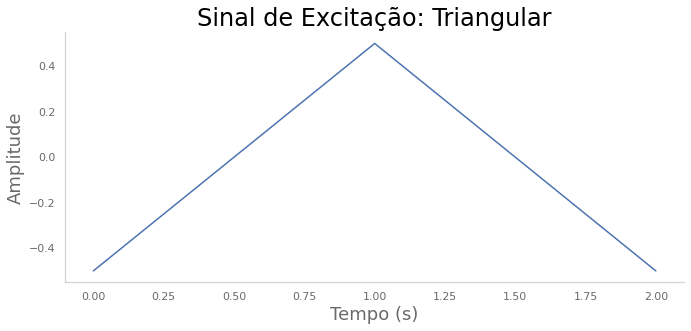

In [2116]:
plt.figure(figsize=(10, 5))
t=np.arange(len(sinal))/fs
plt.title('Sinal de Excitação: Triangular')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,sinal)
plt.tight_layout()

###Nós na Waveguide, Pontos de Entrada e Saída

In [2117]:
nos=round(L/dist) #Número de nós na waveguide
entrada=round(pu*nos) #Ponto de Entrada na waveguide
saida=round(pk*nos) #Ponto de Extração na waveguide

###Filtro digital

In [2118]:
r = np.convolve(-1/(Kr+2),[1, Kr, 1])

###Síntese do áudio por waveguide

In [2119]:
ydir=np.zeros(nos,)
yesq=np.zeros(nos,)
som_saida=[]
for i in range(round(N)):
  first=0
  last=nos-1
  if i <= len(sinal):
    ydir[entrada-1]=ydir[entrada-1]+sinal[i]/2; #caso de superposição
    yesq[entrada-1]=yesq[entrada-1]+sinal[i]/2; #caso de superposição

  #Wave travel  
  rr1=np.dot(r.reshape(1,len(r)),((ydir[last-3:last]).T.reshape(len(ydir[last-3:last]),1))) 
  rr=rr1.reshape(len(rr1),) #wave travel inferior
  lr=yesq[first]*Kr #wave travel superior

  ydir[1:last]=ydir[first:last-1]
  yesq[first:last-1]=yesq[1:last]
  ydir[first]=-lr
  yesq[last-1]=-rr
  w=ydir[saida-1]+yesq[saida-1]
  som_saida.append(w)
  

In [2120]:
som_saida=np.asarray(som_saida)

In [2121]:
Audio(data=som_saida,rate=fs)

###MIR do áudio sintetizado por waveguide

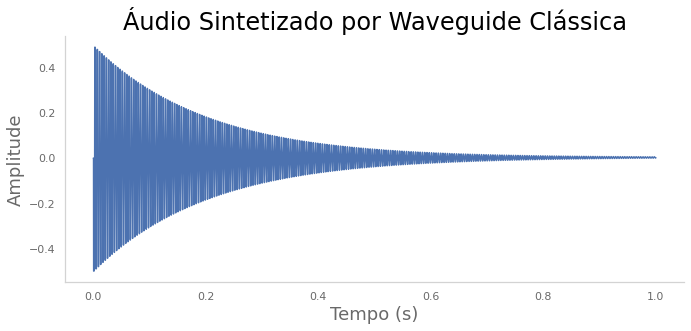

In [2122]:
plt.figure(figsize=(10, 5))
t=np.arange(len(som_saida))/fs
plt.title('Áudio Sintetizado por Waveguide Clássica')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,som_saida)
plt.tight_layout()

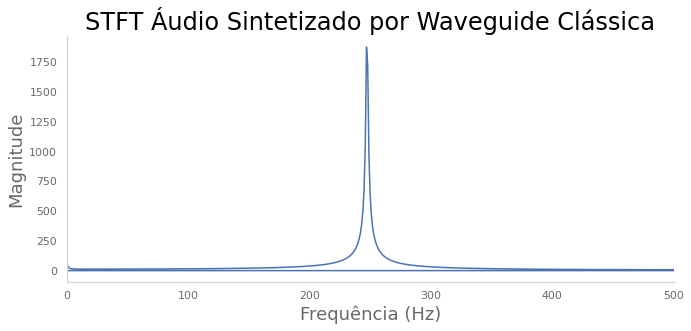

In [2123]:
plt.figure(figsize=(10, 5))
Y = np.fft.fft(som_saida) 
freq = np.fft.fftfreq(som_saida.size, d=1/fs) 
plt.plot(freq, np.abs(Y)) 
plt.title('STFT Áudio Sintetizado por Waveguide Clássica') 
plt.xlabel('Frequência (Hz)') 
plt.ylabel('Magnitude') 
plt.xlim([0, 500])
plt.tight_layout()

In [2124]:
S1a = np.abs(librosa.stft(som_saida, n_fft=4096))**2
chroma1 = librosa.feature.chroma_stft(S=S1a, sr=fs)

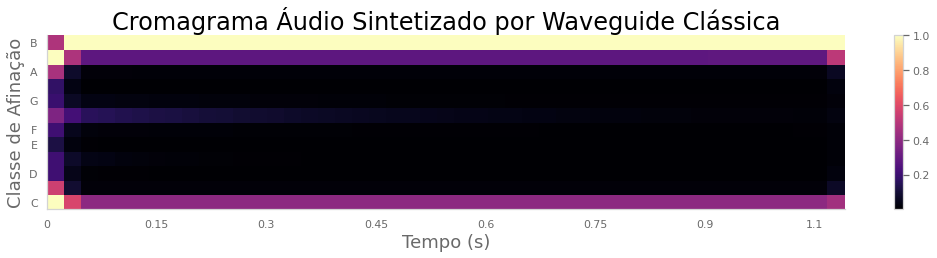

In [2125]:
plt.figure(figsize=(15, 10))
plt.subplot(3, 1, 1)
librosa.display.specshow(chroma1, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Cromagrama Áudio Sintetizado por Waveguide Clássica')
plt.xlabel('Tempo (s)')
plt.ylabel('Classe de Afinação')
plt.tight_layout()

###Formalização do sintetizador por Waveguide Clássica

In [2126]:
def waveguide(f,duracao,fs,excitacao,pu,pk,Kr):
  '''
  Onde:
  f = frequência da nota desejada
  duracao = duração da nota desejada
  fs = sample rate
  excitacao = sinal que inicia a waveguide
  pu = ponto de entrada normalizado na waveguide 0 < pu < 1
  pk = ponto de extração normalizado na waveguide 0 < pk < 1
  Kr = coeficiente de reflexão entre as ondas superior e inferior da Waveguide
  '''
  Ts=1/fs #período(s)
  N=duracao*fs
  c=343.2 #velocidade do som no ar (m/s)
  dist=c*Ts #distância entre os nós
  L=0.2*(1/2**((round(12*np.log2(f/440)))/12)) #comprimento da corda
  nos=round(L/dist) #Número de nós na waveguide
  entrada=round(pu*nos) #Ponto de Entrada na waveguide
  saida=round(pk*nos) #Ponto de Extração na waveguide
  r = np.convolve(-1/(Kr+2),[1, Kr, 1])
  ydir=np.zeros(nos,)
  yesq=np.zeros(nos,)
  som_saida=[]
  for i in range(round(N)):
    first=0
    last=nos-1
    if i <= len(sinal):
      ydir[entrada-1]=ydir[entrada-1]+sinal[i]/2; #caso de superposição
      yesq[entrada-1]=yesq[entrada-1]+sinal[i]/2; #caso de superposição
    
    #Wave travel
    rr1=np.dot(r.reshape(1,len(r)),((ydir[last-3:last]).T.reshape(len(ydir[last-3:last]),1)))
    rr=rr1.reshape(len(rr1),) #wave travel inferior
    lr=yesq[first]*Kr #wave travel superior

    ydir[1:last]=ydir[first:last-1]
    yesq[first:last-1]=yesq[1:last]
    ydir[first]=-lr
    yesq[last-1]=-rr
    w=ydir[saida-1]+yesq[saida-1]
    som_saida.append(w)
  return np.array(som_saida)


##Efeito de corpo na waveguide: Sinal de Excitação a partir da RI de corpo 

###Sinais de Impulso e Resposta de Corpo ao Impulso

In [2127]:
fs0=48000

In [2128]:
y0=scipy.signal.unit_impulse(fs0)

In [2129]:
Audio(data=y0,rate=fs0)

In [2130]:
f1='/content/TFC/IR02/Classical-AmBu2F.wav'
y1, fs1=librosa.load(f1, sr=None, mono=True)

In [2131]:
Audio(data=y1,rate=fs1)

In [2132]:
f2='/content/TFC/IR02/Collings-D2H.wav'
y2, fs2=librosa.load(f2, sr=None, mono=True)

In [2133]:
Audio(data=y2,rate=fs2)

In [2134]:
f3='/content/TFC/IR02/Gibson-J45.wav'
y3, fs3=librosa.load(f3, sr=None, mono=True)

In [2135]:
Audio(data=y3,rate=fs3)

In [2136]:
f4='/content/TFC/IR02/Hummingbird-Classic.wav'
y4, fs4=librosa.load(f4, sr=None, mono=True)

In [2137]:
Audio(data=y4,rate=fs4)

In [2138]:
f5='/content/TFC/IR02/Martin-HD28.wav'
y5, fs5=librosa.load(f5, sr=None, mono=True)

In [2139]:
Audio(data=y5,rate=fs5)

In [2140]:
f6='/content/TFC/IR02/Taylor-814.wav'
y6, fs6=librosa.load(f6, sr=None, mono=True)

In [2141]:
Audio(data=y6,rate=fs6)

In [2142]:
f7='/content/TFC/notaBviolao.wav'
y7, fs7=librosa.load(f7, sr=None, mono=True)

In [2143]:
Audio(data=y7,rate=fs7)

###MIR do Áudio de Controle encontrado no Freesound

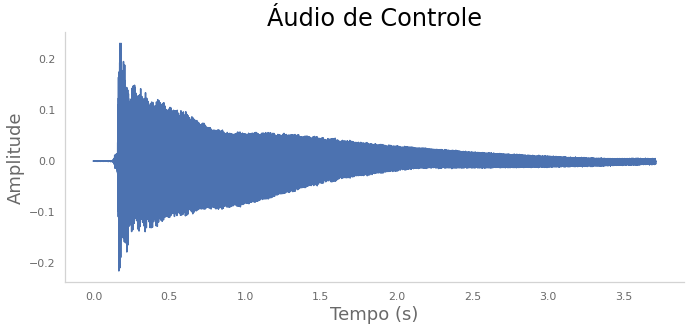

In [2144]:
plt.figure(figsize=(10, 5))
t=np.arange(len(y7))/fs7
plt.title('Áudio de Controle')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,y7)
plt.tight_layout()
plt.savefig('/content/TFC/audiodecontrole.svg', format='svg', dpi=800)

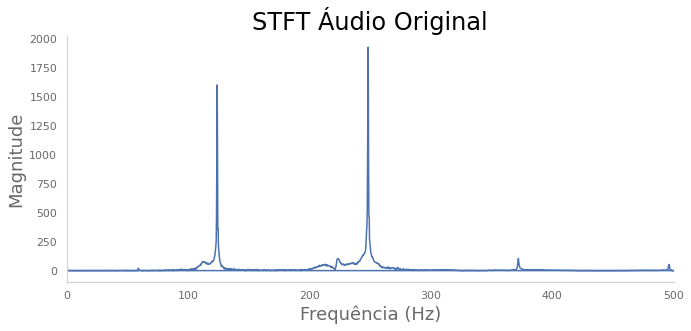

In [2145]:
plt.figure(figsize=(10, 5))
Y7 = np.fft.fft(y7) 
freq = np.fft.fftfreq(y7.size, d=1/fs7) 
plt.plot(freq, np.abs(Y7)) 
plt.title('STFT Áudio Original') 
plt.xlabel('Frequência (Hz)') 
plt.ylabel('Magnitude') 
plt.xlim([0, 500])
plt.tight_layout()
plt.savefig('/content/TFC/stftcontrole.svg', format='svg', dpi=800)

In [2146]:
S7a = np.abs(librosa.stft(y8, n_fft=4096))**2
chroma7 = librosa.feature.chroma_stft(S=S7a, sr=fs7)

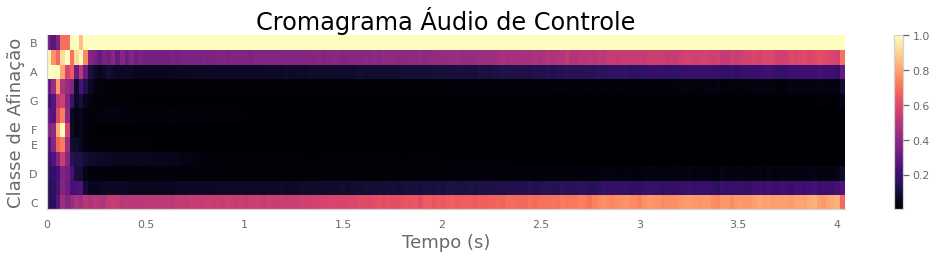

In [2147]:
plt.figure(figsize=(15, 10))
plt.subplot(3, 1, 1)
librosa.display.specshow(chroma7, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Cromagrama Áudio de Controle')
plt.xlabel('Tempo (s)')
plt.ylabel('Classe de Afinação')
plt.tight_layout()
plt.savefig('/content/TFC/cromacontrole.svg', format='svg', dpi=800)

###Excitação como Impulso Unitário

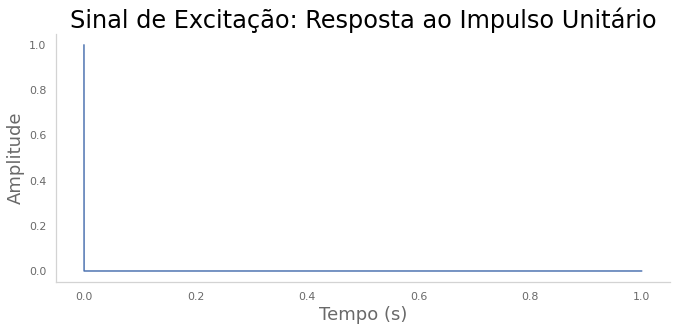

In [2148]:
plt.figure(figsize=(10, 5))
t=np.arange(len(y0))/fs0
plt.title('Sinal de Excitação: Resposta ao Impulso Unitário')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,y0)
plt.tight_layout()
plt.savefig('/content/TFC/y0.svg', format='svg', dpi=800)

In [2149]:
s0 = waveguide(f,duracao,fs0,y0,pu,pk,Kr)

In [2150]:
Audio(data=s0,rate=fs0)

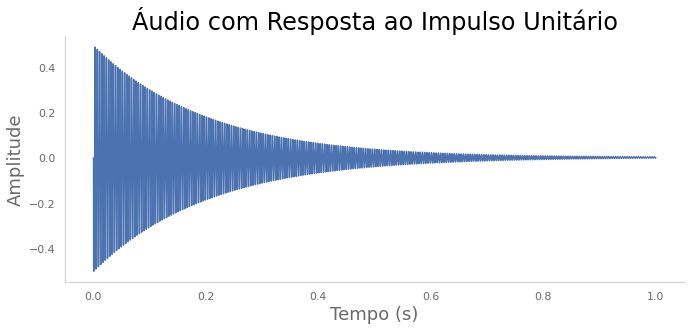

In [2151]:
plt.figure(figsize=(10, 5))
t=np.arange(len(s0))/fs0
plt.title('Áudio com Resposta ao Impulso Unitário')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,s0)
plt.tight_layout()
plt.savefig('/content/TFC/s0.svg', format='svg', dpi=800)

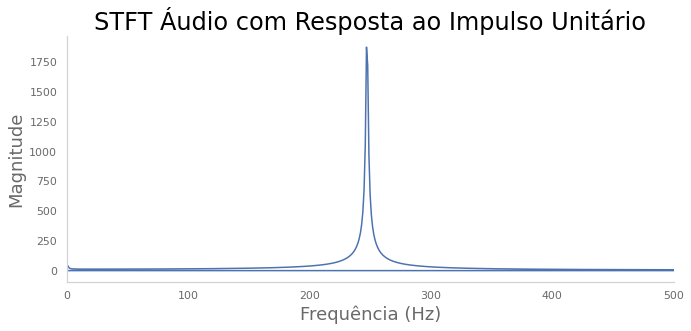

In [2152]:
plt.figure(figsize=(10, 5))
Y0 = np.fft.fft(s0) 
freq = np.fft.fftfreq(s0.size, d=1/fs0) 
plt.plot(freq, np.abs(Y0)) 
plt.title('STFT Áudio com Resposta ao Impulso Unitário') 
plt.xlabel('Frequência (Hz)') 
plt.ylabel('Magnitude') 
plt.xlim([0, 500])
plt.tight_layout()
plt.savefig('/content/TFC/stfts0.svg', format='svg', dpi=800)

In [2153]:
S0a = np.abs(librosa.stft(s0, n_fft=4096))**2
chroma0 = librosa.feature.chroma_stft(S=S0a, sr=fs0)

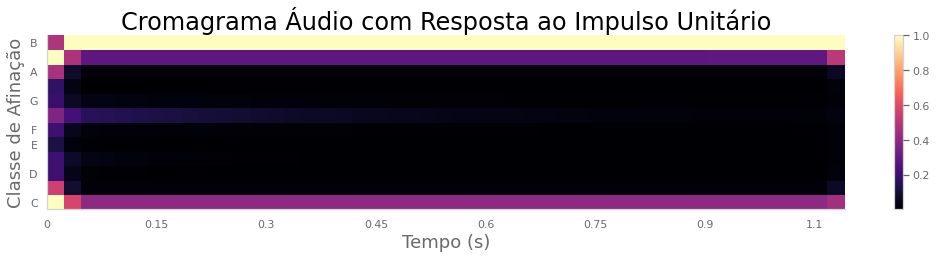

In [2154]:
plt.figure(figsize=(15, 10))
plt.subplot(3, 1, 1)
librosa.display.specshow(chroma0, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Cromagrama Áudio com Resposta ao Impulso Unitário')
plt.xlabel('Tempo (s)')
plt.ylabel('Classe de Afinação')
plt.tight_layout()
plt.savefig('/content/TFC/cromas0.svg', format='svg', dpi=800)

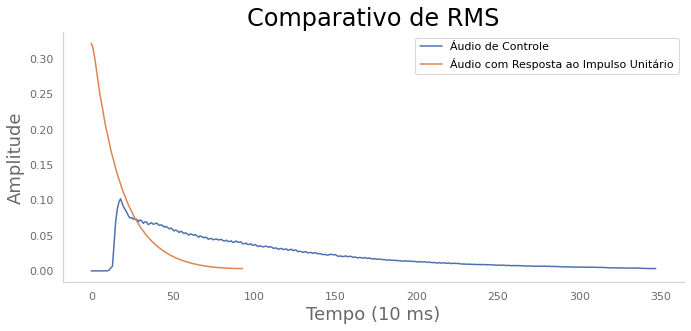

In [2155]:
rms8=librosa.feature.rms(y=y8)
rms0=librosa.feature.rms(y=s0)
plt.figure(figsize=(10, 5))
plt.title('Comparativo de RMS')
plt.plot(rms8.T,label="Áudio de Controle")
plt.plot(rms0.T, label="Áudio com Resposta ao Impulso Unitário")
plt.xlabel('Tempo (10 ms)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.savefig('/content/TFC/rmss0.svg', format='svg', dpi=800)

###Excitação como Resposta ao Impulso do Corpo do Classical-AmBu2F

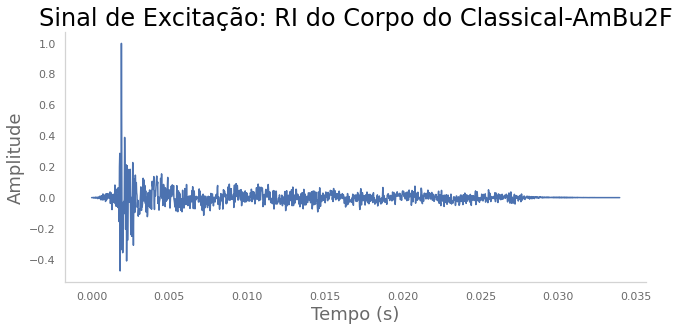

In [2156]:
plt.figure(figsize=(10, 5))
t=np.arange(len(y1))/fs1
plt.title('Sinal de Excitação: RI do Corpo do Classical-AmBu2F')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,y1)
plt.tight_layout()
plt.savefig('/content/TFC/y1.svg', format='svg', dpi=800)

In [2157]:
s1 = waveguide(f,duracao,fs1,y1,pu,pk,Kr)

In [2158]:
Audio(data=s1,rate=fs1)

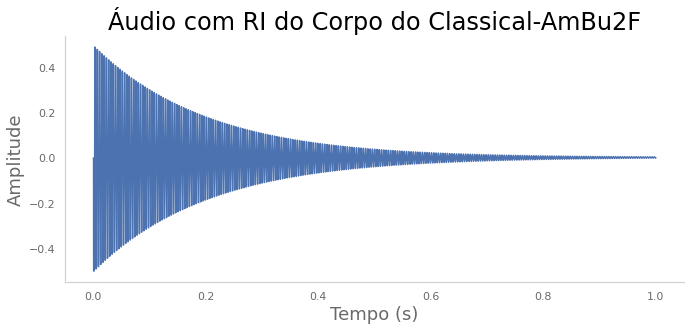

In [2159]:
plt.figure(figsize=(10, 5))
t=np.arange(len(s1))/fs1
plt.title('Áudio com RI do Corpo do Classical-AmBu2F')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,s1)
plt.tight_layout()
plt.savefig('/content/TFC/s1.svg', format='svg', dpi=800)

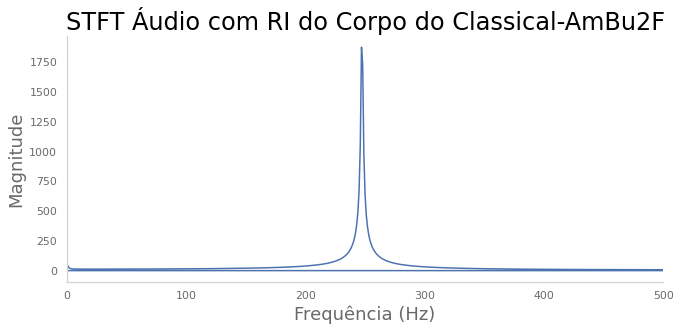

In [2160]:
plt.figure(figsize=(10, 5))
Y1 = np.fft.fft(s1) 
freq = np.fft.fftfreq(s1.size, d=1/fs1) 
plt.plot(freq, np.abs(Y1)) 
plt.title('STFT Áudio com RI do Corpo do Classical-AmBu2F') 
plt.xlabel('Frequência (Hz)') 
plt.ylabel('Magnitude') 
plt.xlim([0, 500])
plt.tight_layout()
plt.savefig('/content/TFC/stfts1.svg', format='svg', dpi=800)

In [2161]:
S1a = np.abs(librosa.stft(s1, n_fft=4096))**2
chroma1 = librosa.feature.chroma_stft(S=S1a, sr=fs1)

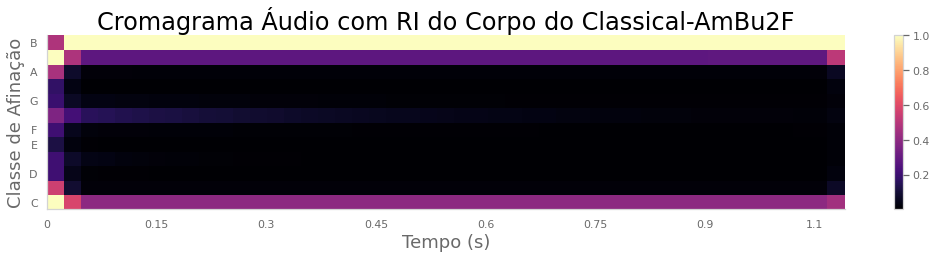

In [2162]:
plt.figure(figsize=(15, 10))
plt.subplot(3, 1, 1)
librosa.display.specshow(chroma1, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Cromagrama Áudio com RI do Corpo do Classical-AmBu2F')
plt.xlabel('Tempo (s)')
plt.ylabel('Classe de Afinação')
plt.tight_layout()
plt.savefig('/content/TFC/cromas1.svg', format='svg', dpi=800)

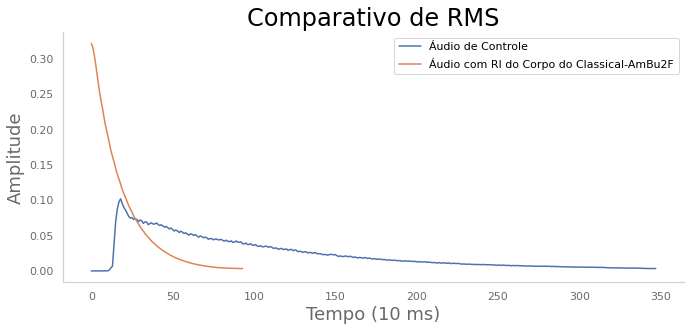

In [2163]:
rms8=librosa.feature.rms(y=y8)
rms1=librosa.feature.rms(y=s1)
plt.figure(figsize=(10, 5))
plt.title('Comparativo de RMS')
plt.plot(rms8.T,label="Áudio de Controle")
plt.plot(rms1.T, label="Áudio com RI do Corpo do Classical-AmBu2F")
plt.xlabel('Tempo (10 ms)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.savefig('/content/TFC/rmss1.svg', format='svg', dpi=800)

###Excitação como Resposta ao Impulso do Corpo do Collings-D2H

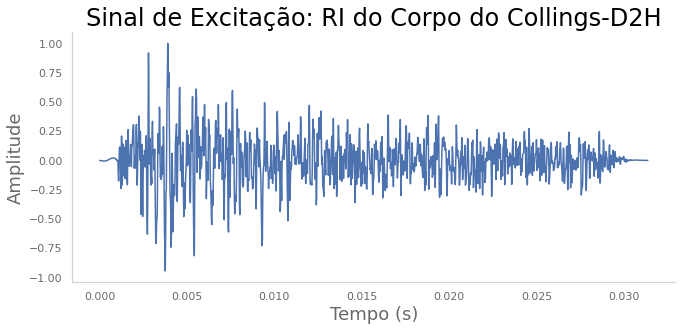

In [2164]:
plt.figure(figsize=(10, 5))
t=np.arange(len(y2))/fs2
plt.title('Sinal de Excitação: RI do Corpo do Collings-D2H')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,y2)
plt.tight_layout()
plt.savefig('/content/TFC/y2.svg', format='svg', dpi=800)

In [2165]:
s2 = waveguide(f,duracao,fs2,y2,pu,pk,Kr)

In [2166]:
Audio(data=s2,rate=fs2)

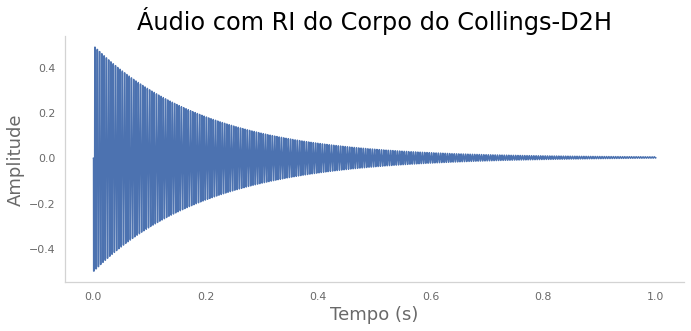

In [2167]:
plt.figure(figsize=(10, 5))
t=np.arange(len(s2))/fs2
plt.title('Áudio com RI do Corpo do Collings-D2H')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,s2)
plt.tight_layout()
plt.savefig('/content/TFC/s2.svg', format='svg', dpi=800)

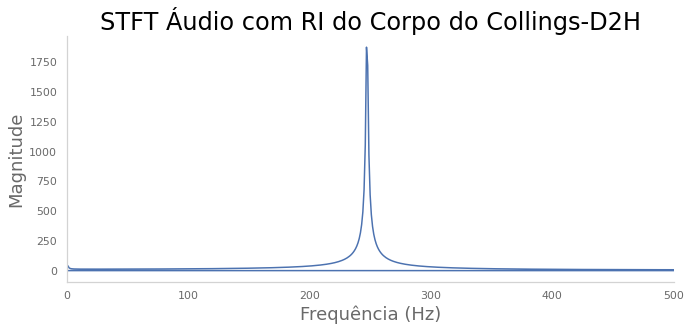

In [2168]:
plt.figure(figsize=(10, 5))
Y2 = np.fft.fft(s2) 
freq = np.fft.fftfreq(s2.size, d=1/fs2) 
plt.plot(freq, np.abs(Y2)) 
plt.title('STFT Áudio com RI do Corpo do Collings-D2H') 
plt.xlabel('Frequência (Hz)') 
plt.ylabel('Magnitude') 
plt.xlim([0, 500])
plt.tight_layout()
plt.savefig('/content/TFC/stfts2.svg', format='svg', dpi=800)

In [2169]:
S2a = np.abs(librosa.stft(s2, n_fft=4096))**2
chroma2 = librosa.feature.chroma_stft(S=S2a, sr=fs2)

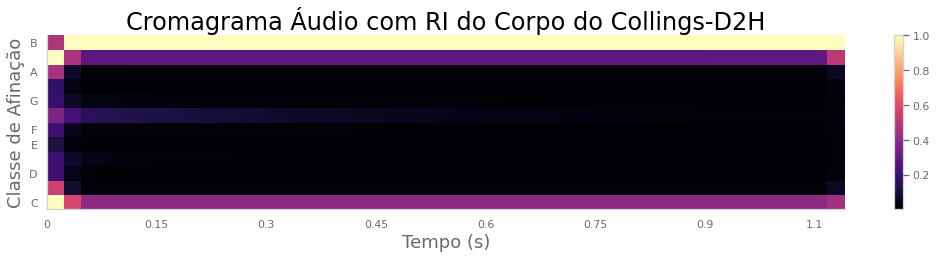

In [2170]:
plt.figure(figsize=(15, 10))
plt.subplot(3, 1, 1)
librosa.display.specshow(chroma2, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Cromagrama Áudio com RI do Corpo do Collings-D2H')
plt.xlabel('Tempo (s)')
plt.ylabel('Classe de Afinação')
plt.tight_layout()
plt.savefig('/content/TFC/cromas2.svg', format='svg', dpi=800)

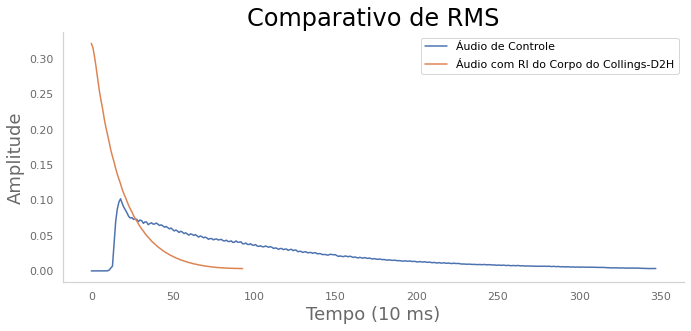

In [2171]:
rms8=librosa.feature.rms(y=y8)
rms2=librosa.feature.rms(y=s2)
plt.figure(figsize=(10, 5))
plt.title('Comparativo de RMS')
plt.plot(rms8.T,label="Áudio de Controle")
plt.plot(rms2.T, label="Áudio com RI do Corpo do Collings-D2H")
plt.xlabel('Tempo (10 ms)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.savefig('/content/TFC/rmss2.svg', format='svg', dpi=800)

###Excitação como Resposta ao Impulso do Corpo do Gibson-J45

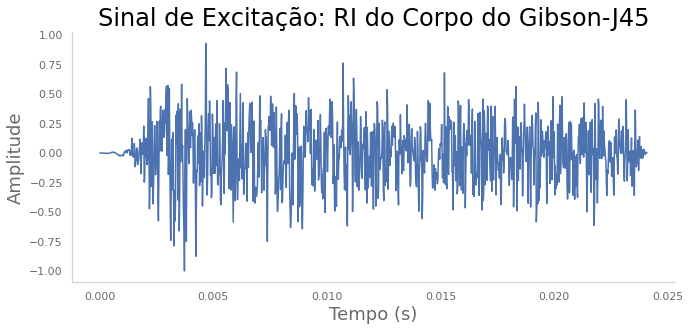

In [2172]:
plt.figure(figsize=(10, 5))
t=np.arange(len(y3))/fs3
plt.title('Sinal de Excitação: RI do Corpo do Gibson-J45')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,y3)
plt.tight_layout()
plt.savefig('/content/TFC/y3.svg', format='svg', dpi=800)

In [2173]:
s3 = waveguide(f,duracao,fs3,y3,pu,pk,Kr)

In [2174]:
Audio(data=s3,rate=fs3)

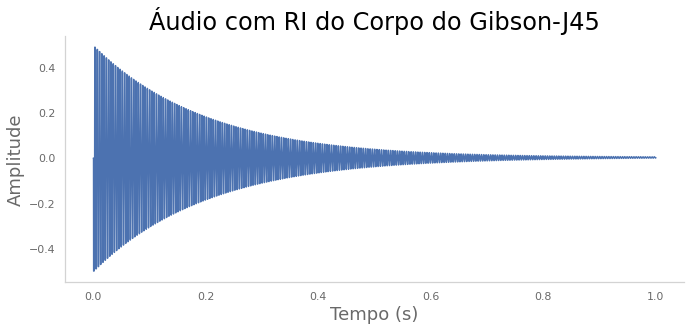

In [2175]:
plt.figure(figsize=(10, 5))
t=np.arange(len(s3))/fs3
plt.title('Áudio com RI do Corpo do Gibson-J45')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,s3)
plt.tight_layout()
plt.savefig('/content/TFC/s3.svg', format='svg', dpi=800)

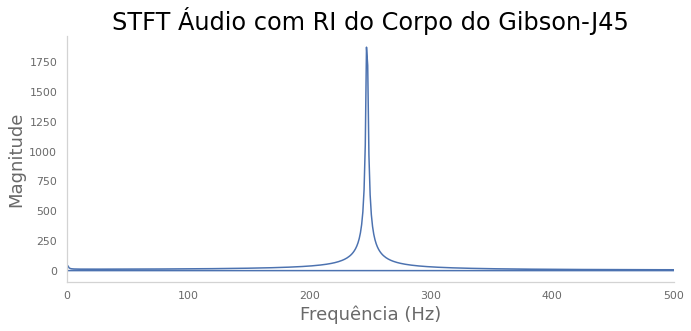

In [2176]:
plt.figure(figsize=(10, 5))
Y3 = np.fft.fft(s3) 
freq = np.fft.fftfreq(s3.size, d=1/fs3) 
plt.plot(freq, np.abs(Y3)) 
plt.title('STFT Áudio com RI do Corpo do Gibson-J45') 
plt.xlabel('Frequência (Hz)') 
plt.ylabel('Magnitude') 
plt.xlim([0, 500])
plt.tight_layout()
plt.savefig('/content/TFC/stfts3.svg', format='svg', dpi=800)

In [2177]:
S3a = np.abs(librosa.stft(s3, n_fft=4096))**2
chroma3 = librosa.feature.chroma_stft(S=S3a, sr=fs3)

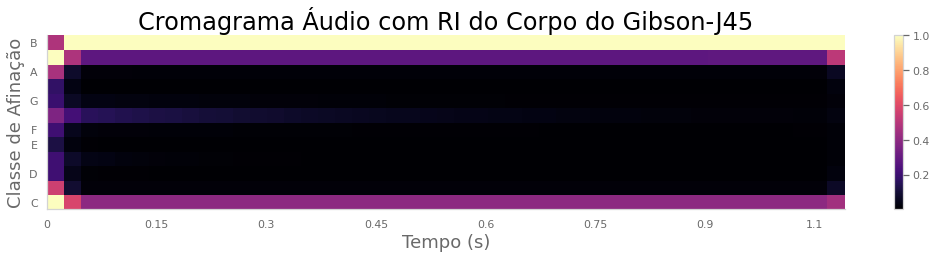

In [2178]:
plt.figure(figsize=(15, 10))
plt.subplot(3, 1, 1)
librosa.display.specshow(chroma3, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Cromagrama Áudio com RI do Corpo do Gibson-J45')
plt.xlabel('Tempo (s)')
plt.ylabel('Classe de Afinação')
plt.tight_layout()
plt.savefig('/content/TFC/cromas3.svg', format='svg', dpi=800)

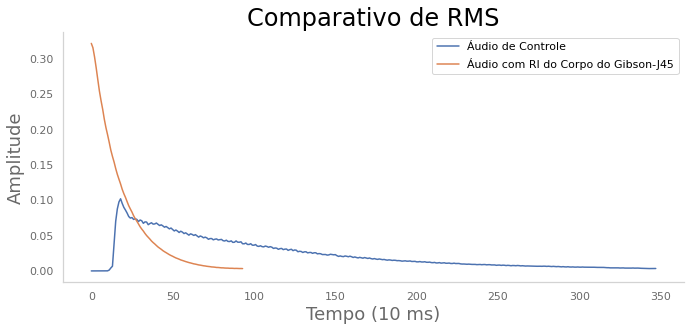

In [2179]:
rms8=librosa.feature.rms(y=y8)
rms3=librosa.feature.rms(y=s3)
plt.figure(figsize=(10, 5))
plt.title('Comparativo de RMS')
plt.plot(rms8.T,label="Áudio de Controle")
plt.plot(rms3.T, label="Áudio com RI do Corpo do Gibson-J45")
plt.xlabel('Tempo (10 ms)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.savefig('/content/TFC/rmss3.svg', format='svg', dpi=800)

###Excitação como Resposta ao Impulso do Corpo do Hummingbird-Classic

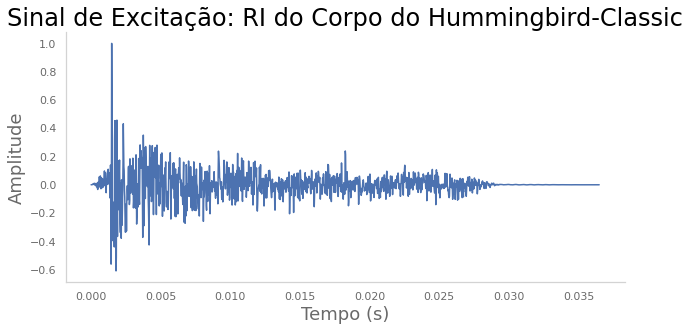

In [2180]:
plt.figure(figsize=(10, 5))
t=np.arange(len(y4))/fs4
plt.title('Sinal de Excitação: RI do Corpo do Hummingbird-Classic')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,y4)
plt.tight_layout()
plt.savefig('/content/TFC/y4.svg', format='svg', dpi=800)

In [2181]:
s4 = waveguide(f,duracao,fs4,y4,pu,pk,Kr)

In [2182]:
Audio(data=s4,rate=fs4)

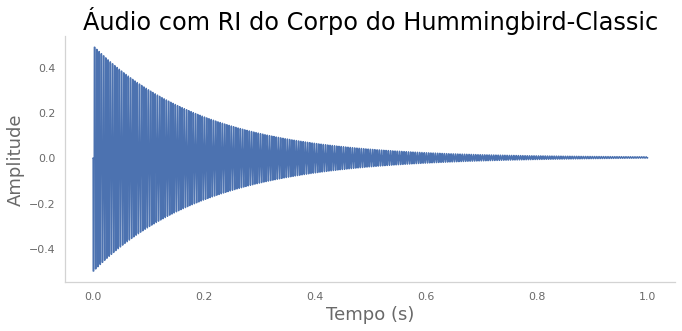

In [2183]:
plt.figure(figsize=(10, 5))
t=np.arange(len(s4))/fs4
plt.title('Áudio com RI do Corpo do Hummingbird-Classic')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,s4)
plt.tight_layout()
plt.savefig('/content/TFC/s4.svg', format='svg', dpi=800)

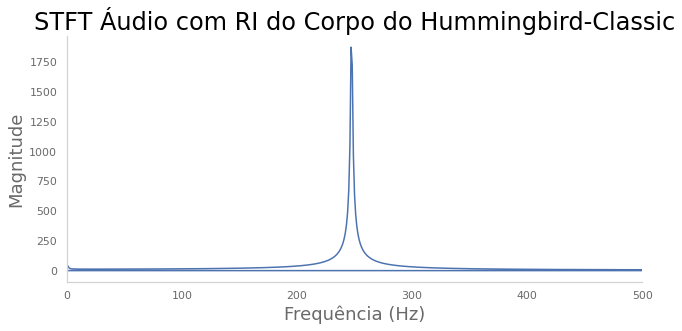

In [2184]:
plt.figure(figsize=(10, 5))
Y4 = np.fft.fft(s4) 
freq = np.fft.fftfreq(s4.size, d=1/fs4) 
plt.plot(freq, np.abs(Y4)) 
plt.title('STFT Áudio com RI do Corpo do Hummingbird-Classic') 
plt.xlabel('Frequência (Hz)') 
plt.ylabel('Magnitude') 
plt.xlim([0, 500])
plt.tight_layout()
plt.savefig('/content/TFC/stfts4.svg', format='svg', dpi=800)

In [2185]:
S4a = np.abs(librosa.stft(s4, n_fft=4096))**2
chroma4 = librosa.feature.chroma_stft(S=S4a, sr=fs4)

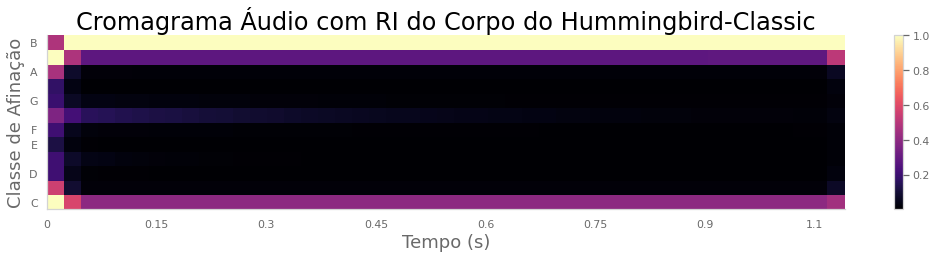

In [2186]:
plt.figure(figsize=(15, 10))
plt.subplot(3, 1, 1)
librosa.display.specshow(chroma4, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Cromagrama Áudio com RI do Corpo do Hummingbird-Classic')
plt.xlabel('Tempo (s)')
plt.ylabel('Classe de Afinação')
plt.tight_layout()
plt.savefig('/content/TFC/cromas4.svg', format='svg', dpi=800)

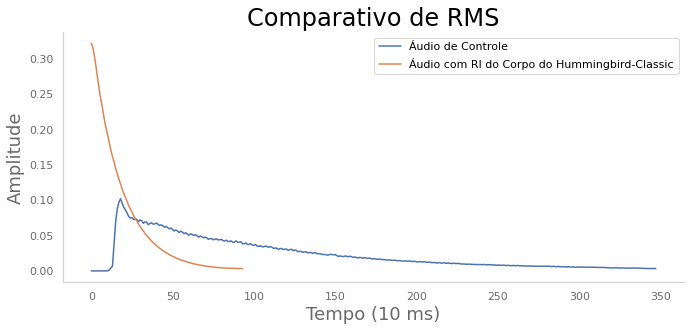

In [2187]:
rms8=librosa.feature.rms(y=y8)
rms4=librosa.feature.rms(y=s4)
plt.figure(figsize=(10, 5))
plt.title('Comparativo de RMS')
plt.plot(rms8.T,label="Áudio de Controle")
plt.plot(rms4.T, label="Áudio com RI do Corpo do Hummingbird-Classic")
plt.xlabel('Tempo (10 ms)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.savefig('/content/TFC/rmss4.svg', format='svg', dpi=800)

###Excitação como Resposta ao Impulso do Corpo do Martin-HD28

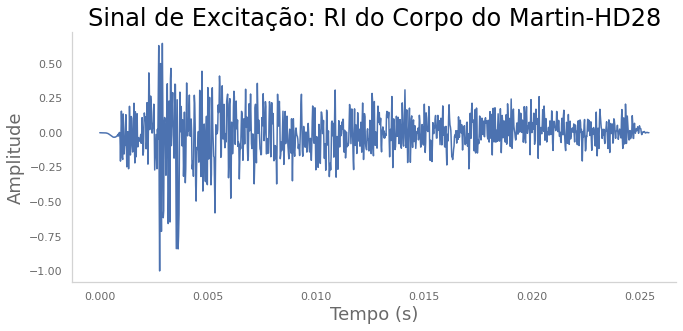

In [2188]:
plt.figure(figsize=(10, 5))
t=np.arange(len(y5))/fs5
plt.title('Sinal de Excitação: RI do Corpo do Martin-HD28')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,y5)
plt.tight_layout()
plt.savefig('/content/TFC/y5.svg', format='svg', dpi=800)

In [2189]:
s5 = waveguide(f,duracao,fs5,y5,pu,pk,Kr)

In [2190]:
Audio(data=s5,rate=fs5)

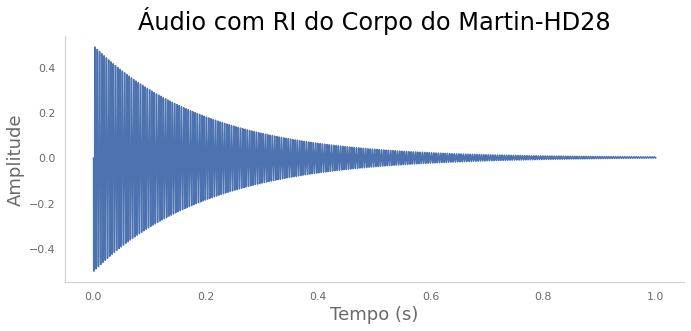

In [2191]:
plt.figure(figsize=(10, 5))
t=np.arange(len(s5))/fs5
plt.title('Áudio com RI do Corpo do Martin-HD28')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,s5)
plt.tight_layout()
plt.savefig('/content/TFC/s5.svg', format='svg', dpi=800)

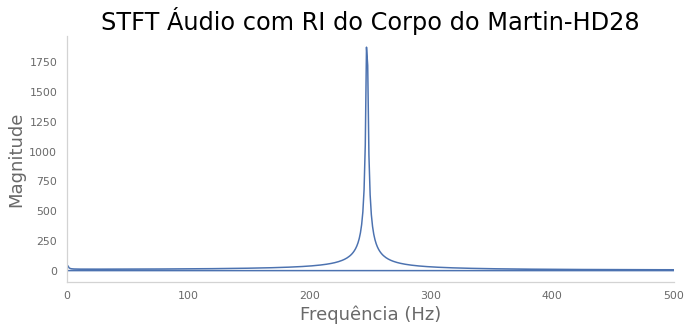

In [2192]:
plt.figure(figsize=(10, 5))
Y5 = np.fft.fft(s5) 
freq = np.fft.fftfreq(s5.size, d=1/fs5) 
plt.plot(freq, np.abs(Y5)) 
plt.title('STFT Áudio com RI do Corpo do Martin-HD28') 
plt.xlabel('Frequência (Hz)') 
plt.ylabel('Magnitude') 
plt.xlim([0, 500])
plt.tight_layout()
plt.savefig('/content/TFC/stfts5.svg', format='svg', dpi=800)

In [2193]:
S5a = np.abs(librosa.stft(s5, n_fft=4096))**2
chroma5 = librosa.feature.chroma_stft(S=S5a, sr=fs5)

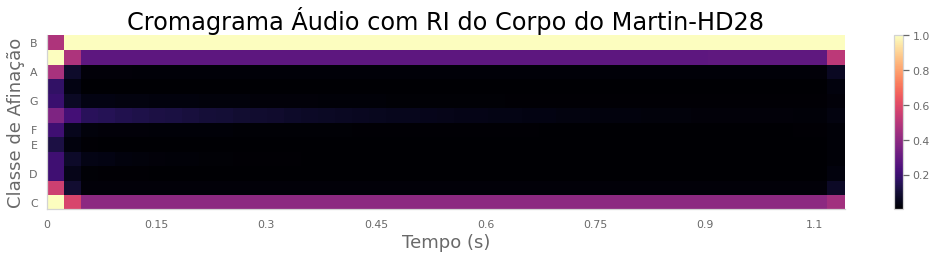

In [2194]:
plt.figure(figsize=(15, 10))
plt.subplot(3, 1, 1)
librosa.display.specshow(chroma5, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Cromagrama Áudio com RI do Corpo do Martin-HD28')
plt.xlabel('Tempo (s)')
plt.ylabel('Classe de Afinação')
plt.tight_layout()
plt.savefig('/content/TFC/cromas5.svg', format='svg', dpi=800)

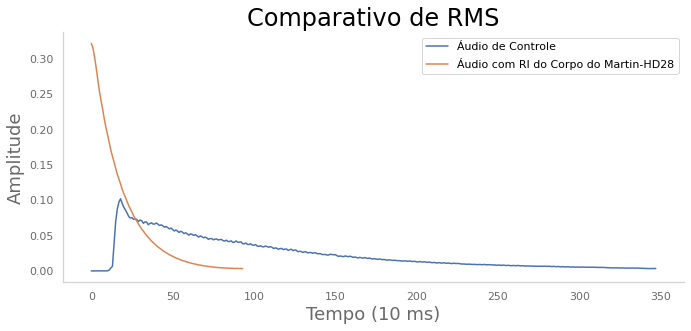

In [2195]:
rms8=librosa.feature.rms(y=y8)
rms5=librosa.feature.rms(y=s5)
plt.figure(figsize=(10, 5))
plt.title('Comparativo de RMS')
plt.plot(rms8.T,label="Áudio de Controle")
plt.plot(rms5.T, label="Áudio com RI do Corpo do Martin-HD28")
plt.xlabel('Tempo (10 ms)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.savefig('/content/TFC/rmss5.svg', format='svg', dpi=800)

###Excitação como Resposta ao Impulso do Corpo do Taylor-814

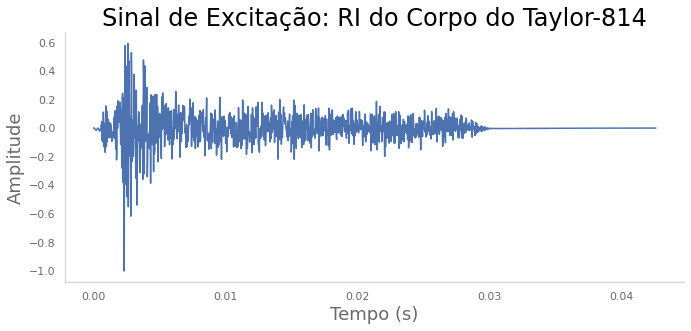

In [2196]:
plt.figure(figsize=(10, 5))
t=np.arange(len(y6))/fs6
plt.title('Sinal de Excitação: RI do Corpo do Taylor-814')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,y6)
plt.tight_layout()
plt.savefig('/content/TFC/y6.svg', format='svg', dpi=800)

In [2197]:
s6 = waveguide(f,duracao,fs6,y6,pu,pk,Kr)

In [2198]:
Audio(data=s6,rate=fs6)

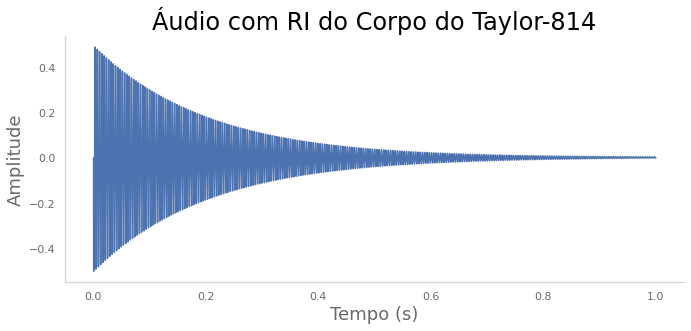

In [2199]:
plt.figure(figsize=(10, 5))
t=np.arange(len(s6))/fs6
plt.title('Áudio com RI do Corpo do Taylor-814')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,s6)
plt.tight_layout()
plt.savefig('/content/TFC/s6.svg', format='svg', dpi=800)

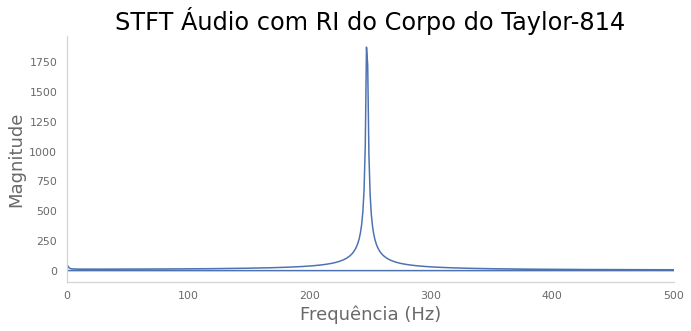

In [2200]:
plt.figure(figsize=(10, 5))
Y6 = np.fft.fft(s6) 
freq = np.fft.fftfreq(s6.size, d=1/fs6) 
plt.plot(freq, np.abs(Y6)) 
plt.title('STFT Áudio com RI do Corpo do Taylor-814') 
plt.xlabel('Frequência (Hz)') 
plt.ylabel('Magnitude') 
plt.xlim([0, 500])
plt.tight_layout()
plt.savefig('/content/TFC/stfts6.svg', format='svg', dpi=800)

In [2201]:
S6a = np.abs(librosa.stft(s6, n_fft=4096))**2
chroma6 = librosa.feature.chroma_stft(S=S6a, sr=fs6)

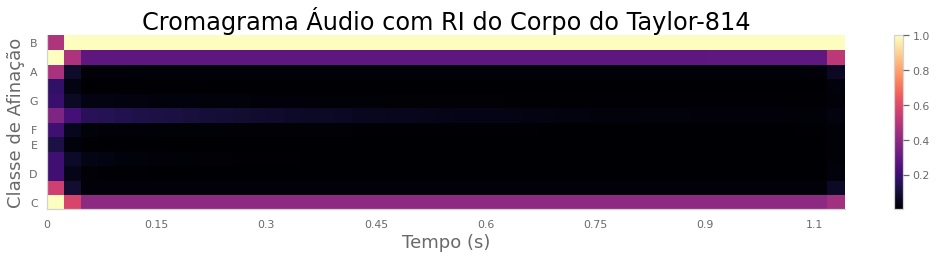

In [2202]:
plt.figure(figsize=(15, 10))
plt.subplot(3, 1, 1)
librosa.display.specshow(chroma6, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Cromagrama Áudio com RI do Corpo do Taylor-814')
plt.xlabel('Tempo (s)')
plt.ylabel('Classe de Afinação')
plt.tight_layout()
plt.savefig('/content/TFC/cromas6.svg', format='svg', dpi=800)

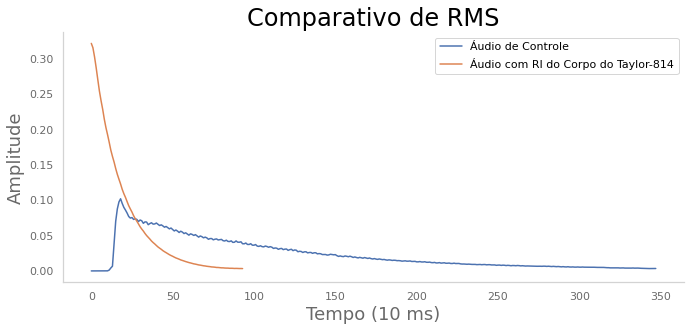

In [2203]:
rms8=librosa.feature.rms(y=y8)
rms6=librosa.feature.rms(y=s6)
plt.figure(figsize=(10, 5))
plt.title('Comparativo de RMS')
plt.plot(rms8.T,label="Áudio de Controle")
plt.plot(rms6.T, label="Áudio com RI do Corpo do Taylor-814")
plt.xlabel('Tempo (10 ms)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.savefig('/content/TFC/rmss6.svg', format='svg', dpi=800)

##Efeito de corpo na waveguide: Áudio pela convolução do sinal sintetizado com a RI de corpo 

###Convolução com Impulso Unitário

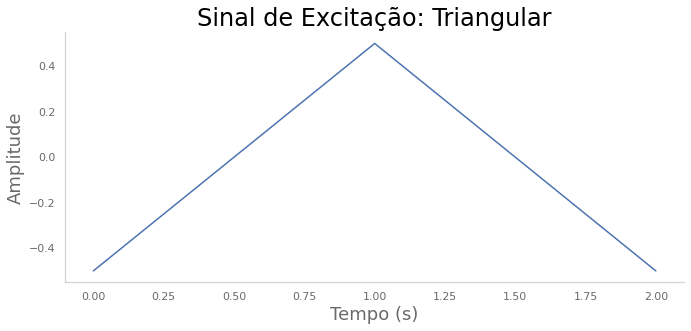

In [2204]:
plt.figure(figsize=(10, 5))
t=np.arange(len(sinal))/fs
plt.title('Sinal de Excitação: Triangular')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,sinal)
plt.tight_layout()
plt.savefig('/content/TFC/y0a.svg', format='svg', dpi=800)

In [2205]:
s0 = scipy.signal.oaconvolve(waveguide(f,duracao,fs0,sinal,pu,pk,Kr),y0)
s0=s0/(max(abs(s0))+.1)

In [2206]:
Audio(data=s0,rate=fs0)

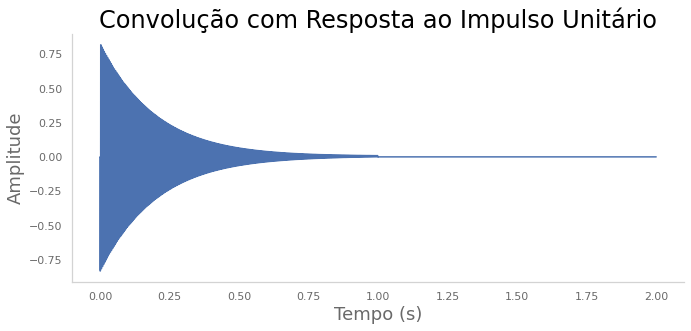

In [2207]:
plt.figure(figsize=(10, 5))
t=np.arange(len(s0))/fs0
plt.title('Convolução com Resposta ao Impulso Unitário')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,s0)
plt.tight_layout()
plt.savefig('/content/TFC/s0a.svg', format='svg', dpi=800)

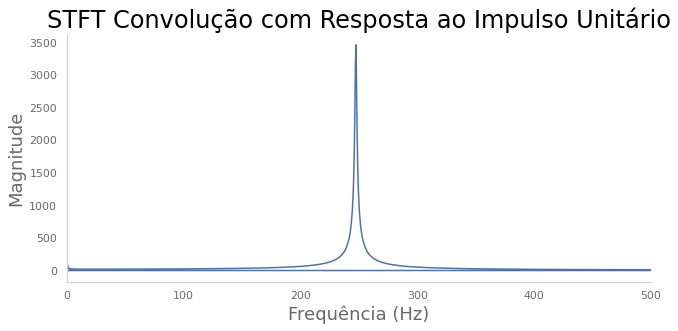

In [2208]:
plt.figure(figsize=(10, 5))
Y0 = np.fft.fft(s0) 
freq = np.fft.fftfreq(s0.size, d=1/fs0) 
plt.plot(freq, np.abs(Y0)) 
plt.title('STFT Convolução com Resposta ao Impulso Unitário') 
plt.xlabel('Frequência (Hz)') 
plt.ylabel('Magnitude') 
plt.xlim([0, 500])
plt.tight_layout()
plt.savefig('/content/TFC/stfts0a.svg', format='svg', dpi=800)

In [2209]:
S0a = np.abs(librosa.stft(s0, n_fft=4096))**2
chroma0 = librosa.feature.chroma_stft(S=S0a, sr=fs0)

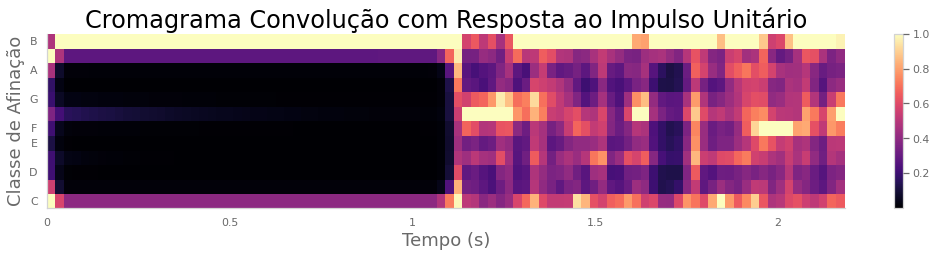

In [2210]:
plt.figure(figsize=(15, 10))
plt.subplot(3, 1, 1)
librosa.display.specshow(chroma0, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Cromagrama Convolução com Resposta ao Impulso Unitário')
plt.xlabel('Tempo (s)')
plt.ylabel('Classe de Afinação')
plt.tight_layout()
plt.savefig('/content/TFC/cromas0a.svg', format='svg', dpi=800)

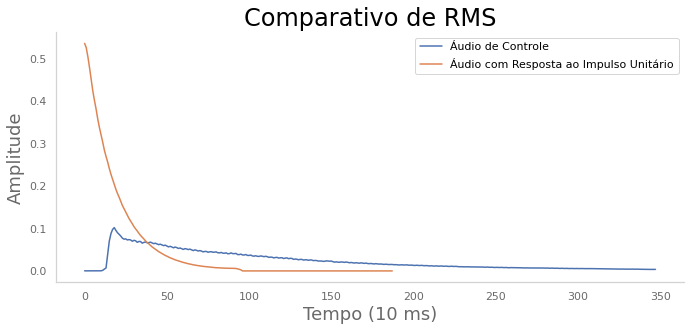

In [2211]:
rms8=librosa.feature.rms(y=y8)
rms0=librosa.feature.rms(y=s0)
plt.figure(figsize=(10, 5))
plt.title('Comparativo de RMS')
plt.plot(rms8.T,label="Áudio de Controle")
plt.plot(rms0.T, label="Áudio com Resposta ao Impulso Unitário")
plt.xlabel('Tempo (10 ms)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.savefig('/content/TFC/rmss0a.svg', format='svg', dpi=800)

###Convolução com Resposta ao Impulso do Corpo do Classical-AmBu2F

In [2212]:
s1 = scipy.signal.oaconvolve(waveguide(f,duracao,fs1,sinal,pu,pk,Kr),y1)
s1=s1/(max(abs(s1))+.1)

In [2213]:
Audio(data=s1,rate=fs1)

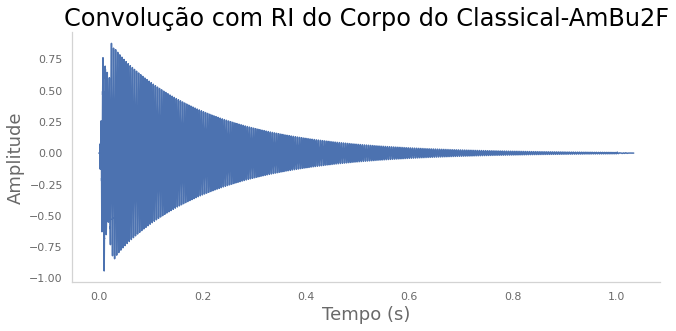

In [2214]:
plt.figure(figsize=(10, 5))
t=np.arange(len(s1))/fs1
plt.title('Convolução com RI do Corpo do Classical-AmBu2F')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,s1)
plt.tight_layout()
plt.savefig('/content/TFC/s1a.svg', format='svg', dpi=800)

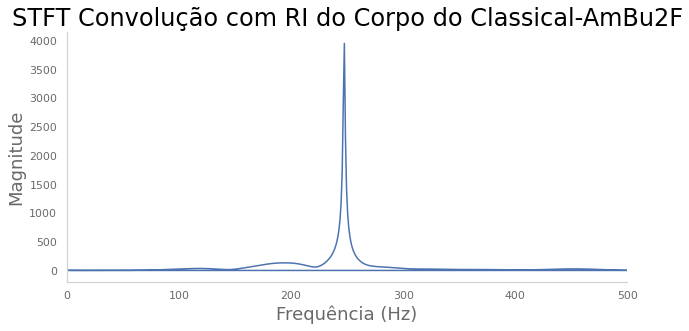

In [2215]:
plt.figure(figsize=(10, 5))
Y1 = np.fft.fft(s1) 
freq = np.fft.fftfreq(s1.size, d=1/fs1) 
plt.plot(freq, np.abs(Y1)) 
plt.title('STFT Convolução com RI do Corpo do Classical-AmBu2F') 
plt.xlabel('Frequência (Hz)') 
plt.ylabel('Magnitude') 
plt.xlim([0, 500])
plt.tight_layout()
plt.savefig('/content/TFC/stfts1a.svg', format='svg', dpi=800)

In [2216]:
S1a = np.abs(librosa.stft(s1, n_fft=4096))**2
chroma1 = librosa.feature.chroma_stft(S=S1a, sr=fs1)

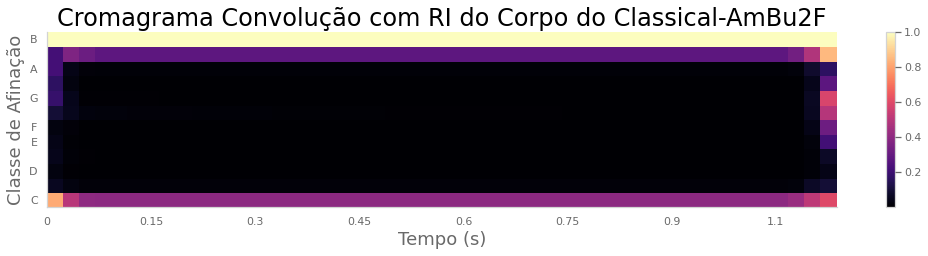

In [2217]:
plt.figure(figsize=(15, 10))
plt.subplot(3, 1, 1)
librosa.display.specshow(chroma1, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Cromagrama Convolução com RI do Corpo do Classical-AmBu2F')
plt.xlabel('Tempo (s)')
plt.ylabel('Classe de Afinação')
plt.tight_layout()
plt.savefig('/content/TFC/cromas1a.svg', format='svg', dpi=800)

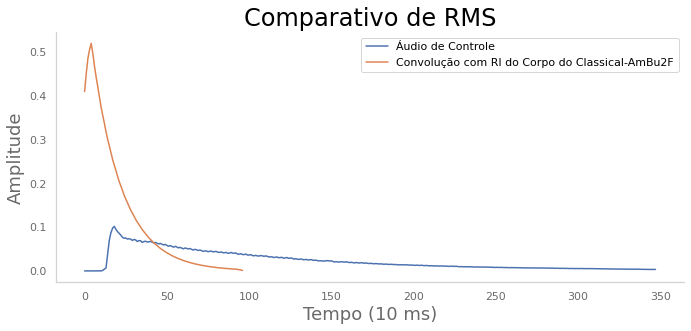

In [2218]:
rms8=librosa.feature.rms(y=y8)
rms1=librosa.feature.rms(y=s1)
plt.figure(figsize=(10, 5))
plt.title('Comparativo de RMS')
plt.plot(rms8.T,label="Áudio de Controle")
plt.plot(rms1.T, label="Convolução com RI do Corpo do Classical-AmBu2F")
plt.xlabel('Tempo (10 ms)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.savefig('/content/TFC/rmss1a.svg', format='svg', dpi=800)

###Convolução com Resposta ao Impulso do Corpo do Collings-D2H

In [2219]:
s2 = scipy.signal.oaconvolve(waveguide(f,duracao,fs2,sinal,pu,pk,Kr),y2)
s2=s2/(max(abs(s2))+.1)

In [2220]:
Audio(data=s2,rate=fs2)

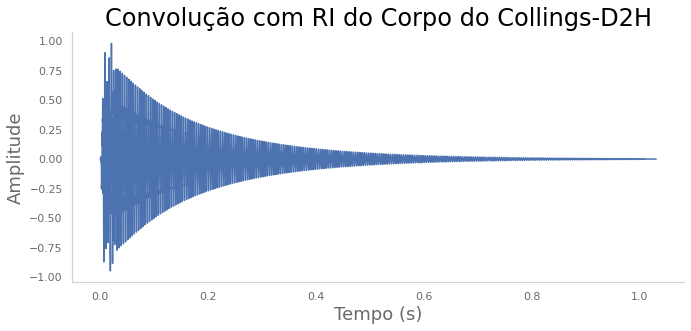

In [2221]:
plt.figure(figsize=(10, 5))
t=np.arange(len(s2))/fs2
plt.title('Convolução com RI do Corpo do Collings-D2H')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,s2)
plt.tight_layout()
plt.savefig('/content/TFC/s2a.svg', format='svg', dpi=800)

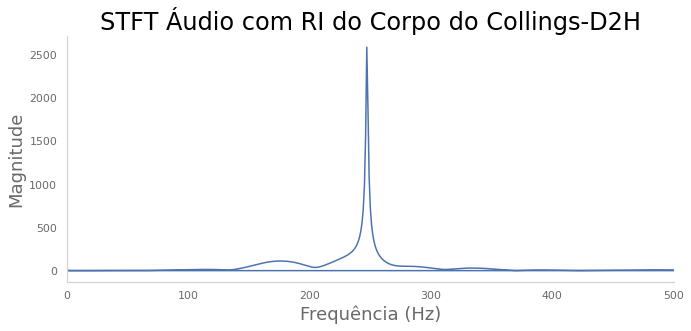

In [2222]:
plt.figure(figsize=(10, 5))
Y2 = np.fft.fft(s2) 
freq = np.fft.fftfreq(s2.size, d=1/fs2) 
plt.plot(freq, np.abs(Y2)) 
plt.title('STFT Áudio com RI do Corpo do Collings-D2H') 
plt.xlabel('Frequência (Hz)') 
plt.ylabel('Magnitude') 
plt.xlim([0, 500])
plt.tight_layout()
plt.savefig('/content/TFC/stfts2a.svg', format='svg', dpi=800)

In [2223]:
S2a = np.abs(librosa.stft(s2, n_fft=4096))**2
chroma2 = librosa.feature.chroma_stft(S=S2a, sr=fs2)

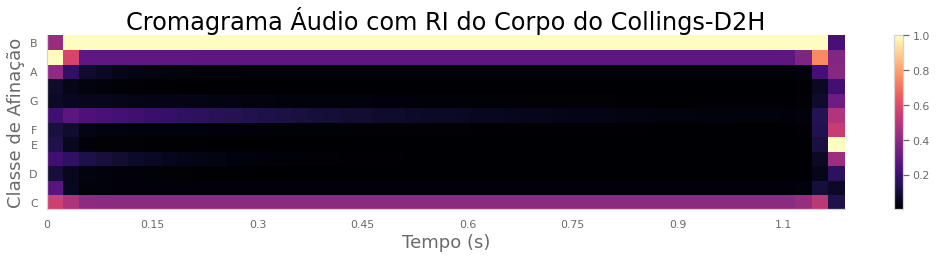

In [2224]:
plt.figure(figsize=(15, 10))
plt.subplot(3, 1, 1)
librosa.display.specshow(chroma2, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Cromagrama Áudio com RI do Corpo do Collings-D2H')
plt.xlabel('Tempo (s)')
plt.ylabel('Classe de Afinação')
plt.tight_layout()
plt.savefig('/content/TFC/cromas2a.svg', format='svg', dpi=800)

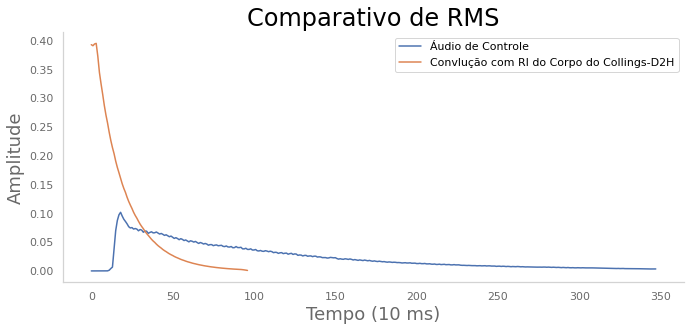

In [2225]:
rms8=librosa.feature.rms(y=y8)
rms2=librosa.feature.rms(y=s2)
plt.figure(figsize=(10, 5))
plt.title('Comparativo de RMS')
plt.plot(rms8.T,label="Áudio de Controle")
plt.plot(rms2.T, label="Convlução com RI do Corpo do Collings-D2H")
plt.xlabel('Tempo (10 ms)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.savefig('/content/TFC/rmss2a.svg', format='svg', dpi=800)

###Convolução com Resposta ao Impulso do Corpo do Gibson-J45

In [2226]:
s3 = scipy.signal.oaconvolve(waveguide(f,duracao,fs3,sinal,pu,pk,Kr),y3)
s3=s3/(max(abs(s3))+.1)

In [2227]:
Audio(data=s3,rate=fs3)

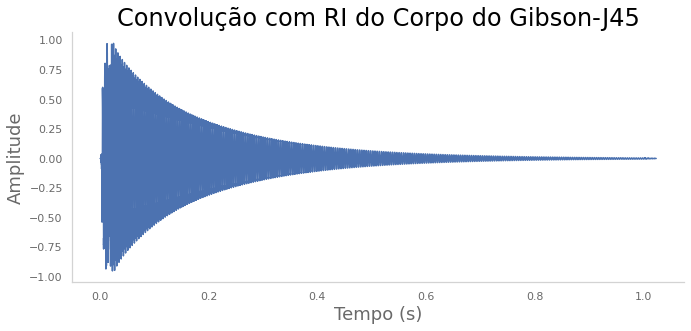

In [2228]:
plt.figure(figsize=(10, 5))
t=np.arange(len(s3))/fs3
plt.title('Convolução com RI do Corpo do Gibson-J45')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,s3)
plt.tight_layout()
plt.savefig('/content/TFC/s3a.svg', format='svg', dpi=800)

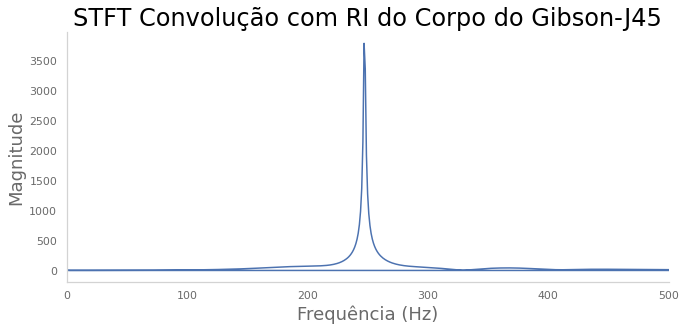

In [2229]:
plt.figure(figsize=(10, 5))
Y3 = np.fft.fft(s3) 
freq = np.fft.fftfreq(s3.size, d=1/fs3) 
plt.plot(freq, np.abs(Y3)) 
plt.title('STFT Convolução com RI do Corpo do Gibson-J45') 
plt.xlabel('Frequência (Hz)') 
plt.ylabel('Magnitude') 
plt.xlim([0, 500])
plt.tight_layout()
plt.savefig('/content/TFC/stfts3a.svg', format='svg', dpi=800)

In [2230]:
S3a = np.abs(librosa.stft(s3, n_fft=4096))**2
chroma3 = librosa.feature.chroma_stft(S=S3a, sr=fs3)

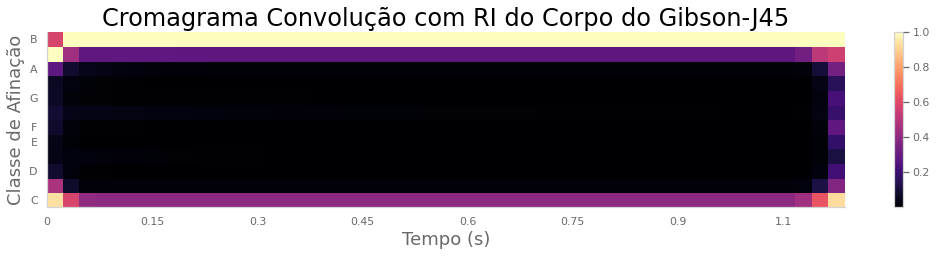

In [2231]:
plt.figure(figsize=(15, 10))
plt.subplot(3, 1, 1)
librosa.display.specshow(chroma3, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Cromagrama Convolução com RI do Corpo do Gibson-J45')
plt.xlabel('Tempo (s)')
plt.ylabel('Classe de Afinação')
plt.tight_layout()
plt.savefig('/content/TFC/cromas3a.svg', format='svg', dpi=800)

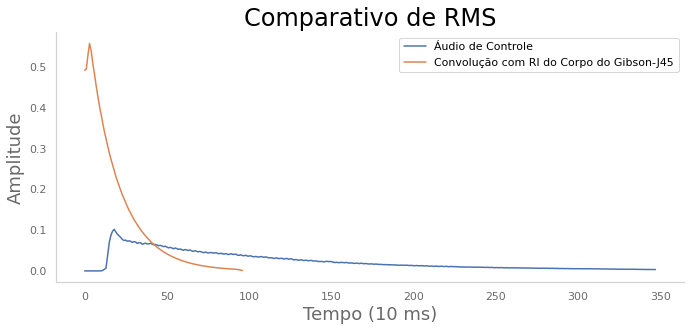

In [2232]:
rms8=librosa.feature.rms(y=y8)
rms3=librosa.feature.rms(y=s3)
plt.figure(figsize=(10, 5))
plt.title('Comparativo de RMS')
plt.plot(rms8.T,label="Áudio de Controle")
plt.plot(rms3.T, label="Convolução com RI do Corpo do Gibson-J45")
plt.xlabel('Tempo (10 ms)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.savefig('/content/TFC/rmss3a.svg', format='svg', dpi=800)

###Excitação com Resposta ao Impulso do Corpo do Hummingbird-Classic

In [2233]:
s4 = scipy.signal.oaconvolve(waveguide(f,duracao,fs4,sinal,pu,pk,Kr),y4)
s4=s4/(max(abs(s4))+.1)

In [2234]:
Audio(data=s4,rate=fs4)

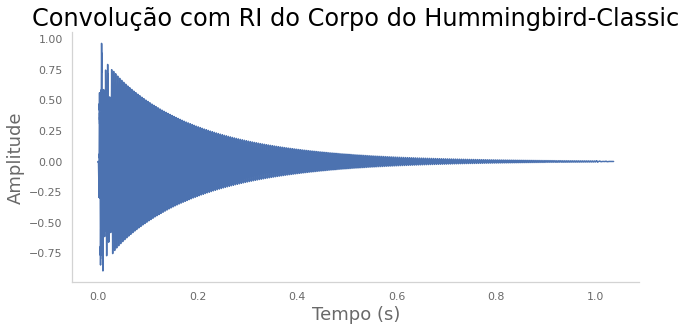

In [2235]:
plt.figure(figsize=(10, 5))
t=np.arange(len(s4))/fs4
plt.title('Convolução com RI do Corpo do Hummingbird-Classic')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,s4)
plt.tight_layout()
plt.savefig('/content/TFC/s4a.svg', format='svg', dpi=800)

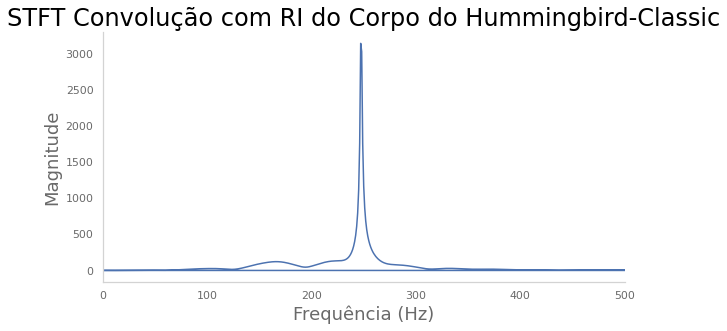

In [2236]:
plt.figure(figsize=(10, 5))
Y4 = np.fft.fft(s4) 
freq = np.fft.fftfreq(s4.size, d=1/fs4) 
plt.plot(freq, np.abs(Y4)) 
plt.title('STFT Convolução com RI do Corpo do Hummingbird-Classic') 
plt.xlabel('Frequência (Hz)') 
plt.ylabel('Magnitude') 
plt.xlim([0, 500])
plt.tight_layout()
plt.savefig('/content/TFC/stfts4a.svg', format='svg', dpi=800)

In [2237]:
S4a = np.abs(librosa.stft(s4, n_fft=4096))**2
chroma4 = librosa.feature.chroma_stft(S=S4a, sr=fs4)

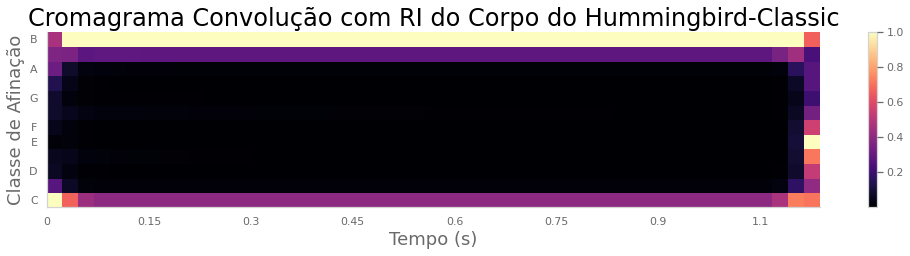

In [2238]:
plt.figure(figsize=(15, 10))
plt.subplot(3, 1, 1)
librosa.display.specshow(chroma4, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Cromagrama Convolução com RI do Corpo do Hummingbird-Classic')
plt.xlabel('Tempo (s)')
plt.ylabel('Classe de Afinação')
plt.tight_layout()
plt.savefig('/content/TFC/cromas4a.svg', format='svg', dpi=800)

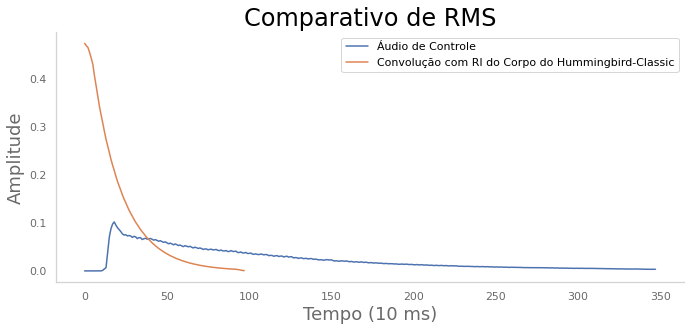

In [2239]:
rms8=librosa.feature.rms(y=y8)
rms4=librosa.feature.rms(y=s4)
plt.figure(figsize=(10, 5))
plt.title('Comparativo de RMS')
plt.plot(rms8.T,label="Áudio de Controle")
plt.plot(rms4.T, label="Convolução com RI do Corpo do Hummingbird-Classic")
plt.xlabel('Tempo (10 ms)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.savefig('/content/TFC/rmss4a.svg', format='svg', dpi=800)

###Convolução com Resposta ao Impulso do Corpo do Martin-HD28

In [2240]:
s5 = scipy.signal.oaconvolve(waveguide(f,duracao,fs5,sinal,pu,pk,Kr),y5)
s5=s5/(max(abs(s5))+.1)

In [2241]:
Audio(data=s5,rate=fs5)

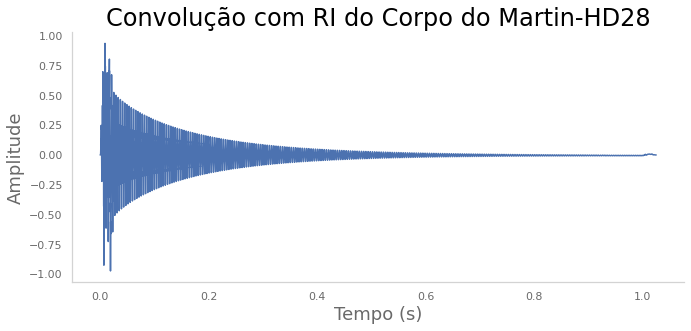

In [2242]:
plt.figure(figsize=(10, 5))
t=np.arange(len(s5))/fs5
plt.title('Convolução com RI do Corpo do Martin-HD28')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,s5)
plt.tight_layout()
plt.savefig('/content/TFC/s5a.svg', format='svg', dpi=800)

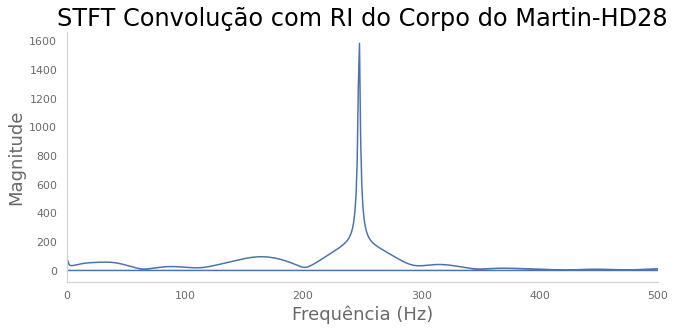

In [2243]:
plt.figure(figsize=(10, 5))
Y5 = np.fft.fft(s5) 
freq = np.fft.fftfreq(s5.size, d=1/fs5) 
plt.plot(freq, np.abs(Y5)) 
plt.title('STFT Convolução com RI do Corpo do Martin-HD28') 
plt.xlabel('Frequência (Hz)') 
plt.ylabel('Magnitude') 
plt.xlim([0, 500])
plt.tight_layout()
plt.savefig('/content/TFC/stfts5a.svg', format='svg', dpi=800)

In [2244]:
S5a = np.abs(librosa.stft(s5, n_fft=4096))**2
chroma5 = librosa.feature.chroma_stft(S=S5a, sr=fs5)

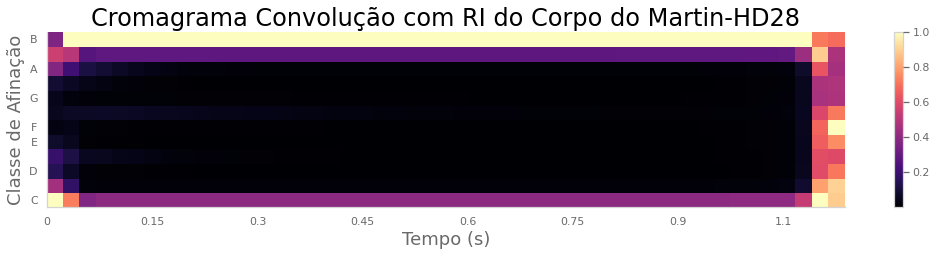

In [2245]:
plt.figure(figsize=(15, 10))
plt.subplot(3, 1, 1)
librosa.display.specshow(chroma5, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Cromagrama Convolução com RI do Corpo do Martin-HD28')
plt.xlabel('Tempo (s)')
plt.ylabel('Classe de Afinação')
plt.tight_layout()
plt.savefig('/content/TFC/cromas5a.svg', format='svg', dpi=800)

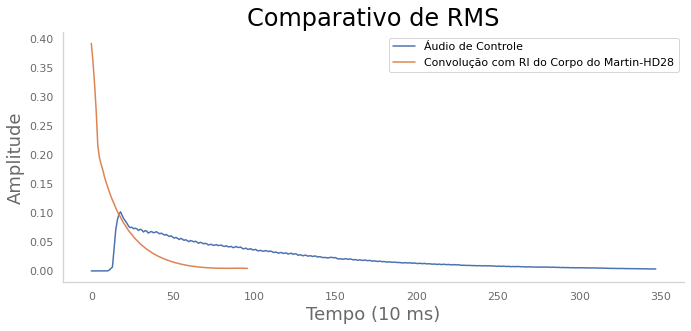

In [2246]:
rms8=librosa.feature.rms(y=y8)
rms5=librosa.feature.rms(y=s5)
plt.figure(figsize=(10, 5))
plt.title('Comparativo de RMS')
plt.plot(rms8.T,label="Áudio de Controle")
plt.plot(rms5.T, label="Convolução com RI do Corpo do Martin-HD28")
plt.xlabel('Tempo (10 ms)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.savefig('/content/TFC/rmss5a.svg', format='svg', dpi=800)

###Convolução com Resposta ao Impulso do Corpo do Taylor-814

In [2247]:
s6 = scipy.signal.oaconvolve(waveguide(f,duracao,fs6,sinal,pu,pk,Kr),y6)
s6=s6/(max(abs(s6))+.1)

In [2248]:
Audio(data=s6,rate=fs6)

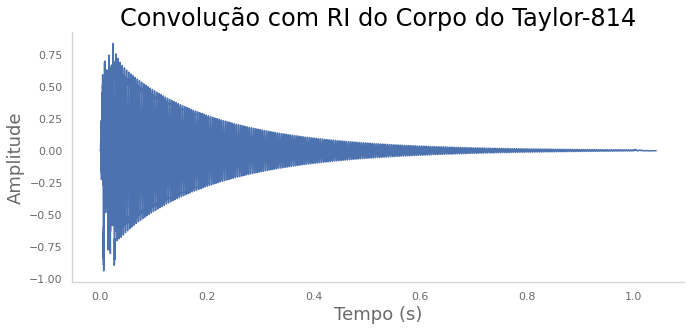

In [2249]:
plt.figure(figsize=(10, 5))
t=np.arange(len(s6))/fs6
plt.title('Convolução com RI do Corpo do Taylor-814')
plt.xlabel('Tempo (s)')
plt.ylabel('Amplitude')
plt.plot(t,s6)
plt.tight_layout()
plt.savefig('/content/TFC/s6a.svg', format='svg', dpi=800)

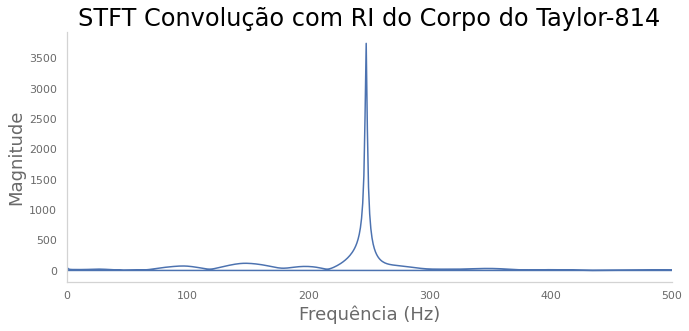

In [2250]:
plt.figure(figsize=(10, 5))
Y6 = np.fft.fft(s6) 
freq = np.fft.fftfreq(s6.size, d=1/fs6) 
plt.plot(freq, np.abs(Y6)) 
plt.title('STFT Convolução com RI do Corpo do Taylor-814') 
plt.xlabel('Frequência (Hz)') 
plt.ylabel('Magnitude') 
plt.xlim([0, 500])
plt.tight_layout()
plt.savefig('/content/TFC/stfts6a.svg', format='svg', dpi=800)

In [2251]:
S6a = np.abs(librosa.stft(s6, n_fft=4096))**2
chroma6 = librosa.feature.chroma_stft(S=S6a, sr=fs6)

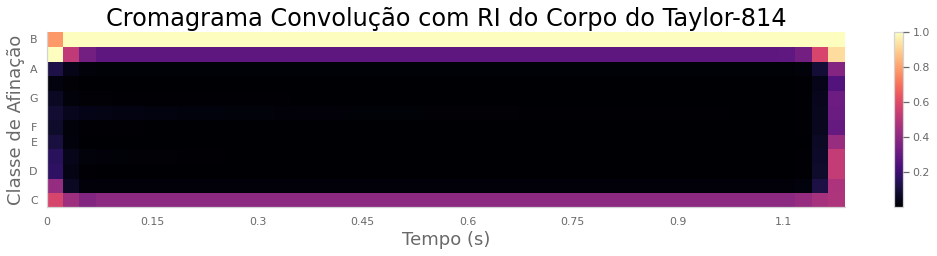

In [2252]:
plt.figure(figsize=(15, 10))
plt.subplot(3, 1, 1)
librosa.display.specshow(chroma6, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Cromagrama Convolução com RI do Corpo do Taylor-814')
plt.xlabel('Tempo (s)')
plt.ylabel('Classe de Afinação')
plt.tight_layout()
plt.savefig('/content/TFC/cromas6a.svg', format='svg', dpi=800)

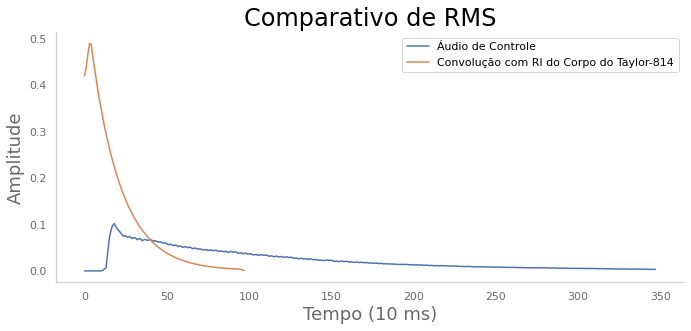

In [2253]:
rms8=librosa.feature.rms(y=y8)
rms6=librosa.feature.rms(y=s6)
plt.figure(figsize=(10, 5))
plt.title('Comparativo de RMS')
plt.plot(rms8.T,label="Áudio de Controle")
plt.plot(rms6.T, label="Convolução com RI do Corpo do Taylor-814")
plt.xlabel('Tempo (10 ms)')
plt.ylabel('Amplitude')
plt.legend()
plt.tight_layout()
plt.savefig('/content/TFC/rmss6a.svg', format='svg', dpi=800)

#Síntese de 2 Oitavas Musicais


##Oitava Central: onde [0] = Dó, [1] = Dó#, [2] = Ré, [3] = Ré#, [4] = Mi, [5] = Fá, [6] = Fá#, [7] = Sol, [8] = Sol#, [9] = Lá, [10] = Lá#, [11] = Si, [12] = Dó.

In [2254]:
freqs = np.logspace(0, 1, num=13, base=2) *263
ng03=[]
for freq in freqs:
    sample03=waveguide(freq,0.3,fs,sinal,pu,pk,Kr)
    ng03.append(sample03)    

In [2255]:
freqs = np.logspace(0, 1, num=13, base=2) *263
ng05=[]
for freq in freqs:
    sample05=waveguide(freq,0.5,fs,sinal,pu,pk,Kr)
    ng05.append(sample05)    

In [2256]:
freqs = np.logspace(0, 1, num=13, base=2) *263
ng07=[]
for freq in freqs:
    sample07=waveguide(freq,0.7,fs,sinal,pu,pk,Kr)
    ng07.append(sample07)

In [2257]:
freqs = np.logspace(0, 1, num=13, base=2) *263
ng10=[]
for freq in freqs:
    sample10=waveguide(freq,1,fs,sinal,pu,pk,Kr)
    ng10.append(sample10)

In [2258]:
freqs = np.logspace(0, 1, num=13, base=2) *263
ng15=[]
for freq in freqs:
    sample15=waveguide(freq,1.5,fs,sinal,pu,pk,Kr)
    ng15.append(sample15)

##Oitava acima da Central: onde [0] = Dó, [1] = Dó#, [2] = Ré, [3] = Ré#, [4] = Mi, [5] = Fá, [6] = Fá#, [7] = Sol, [8] = Sol#, [9] = Lá, [10] = Lá#, [11] = Si, [12] = Dó.

In [2259]:
freqs = np.logspace(0, 1, num=13, base=2) *526
nf03=[]
for freq in freqs:
    sample03=waveguide(freq,0.3,fs,sinal,pu,pk,Kr)
    nf03.append(sample03)    

In [2260]:
freqs = np.logspace(0, 1, num=13, base=2) *526
nf05=[]
for freq in freqs:
    sample05=waveguide(freq,0.5,fs,sinal,pu,pk,Kr)
    nf05.append(sample05)    

In [2261]:
freqs = np.logspace(0, 1, num=13, base=2) *526
nf07=[]
for freq in freqs:
    sample07=waveguide(freq,0.7,fs,sinal,pu,pk,Kr)
    nf07.append(sample07)

In [2262]:
freqs = np.logspace(0, 1, num=13, base=2) *526
nf10=[]
for freq in freqs:
    sample10=waveguide(freq,1,fs,sinal,pu,pk,Kr)
    nf10.append(sample10)

In [2263]:
freqs = np.logspace(0, 1, num=13, base=2) *526
nf15=[]
for freq in freqs:
    sample15=waveguide(freq,1.5,fs,sinal,pu,pk,Kr)
    nf15.append(sample15)

#Composições musicais feitas pelas notas sintetizadas:

##Trecho de Jesus, a alegria dos Homens - Bach

In [2265]:
k=np.hstack((
ng03[7], ng03[9], ng03[11], nf03[2], nf03[0], nf03[0], nf03[4], nf03[2],
nf03[2], nf03[7], nf03[6], nf03[7], nf03[2], ng03[11], ng03[7], ng03[9], ng03[11],
nf03[0], nf03[2], nf03[4], nf03[2], nf03[0], ng03[11], ng03[9], ng03[11], ng03[7],
ng03[6], ng03[7], ng03[9], ng03[2], ng03[6], ng03[9], nf03[0], ng03[11], ng03[9],
ng03[11], ng03[7], ng03[9], ng03[11], nf03[2], nf03[0], nf03[0], nf03[4], nf03[2],
nf03[2], nf03[7], nf03[6], nf03[7], nf03[2], ng03[11], ng03[7], ng03[9], ng03[11],
ng03[4],nf03[2], nf03[0], ng03[11], ng03[9], ng03[7], ng03[2], ng03[7], ng03[6],ng05[7]   
))
display(Audio(k,rate=fs))

##Trecho Abertura GOT

In [2266]:
k=np.hstack((
ng15[9], ng15[2], ng03[5], ng03[7], ng07[9], ng07[2], ng03[5], ng03[7], ng15[4],
ng15[7], ng15[0], ng03[5], ng03[4], ng07[7], ng07[0], ng03[5], ng03[4], ng15[2],
ng15[9], ng15[2], ng03[5], ng03[7], ng07[9], ng07[2], ng03[5], ng03[7], ng15[4],
ng15[7], ng15[0], ng07[4], ng07[5], ng07[4], ng07[0], ng07[2],
       ))
display(Audio(k,rate=fs))